### AUTORA
**Mar Iborra Granel**

### CURSO
_3 MAIS_

# Tarea calificada 1 INAR_2023


## Cat vs. Dog Image Classification

Este ejercicio consiste en desarrollar un modelo deep learning CNN (aunque eres libre de probar otras alternativas) para una dataset que contiene imágenes de perros y gatos (exclusivamente). 

Se debe entregar este notebook (como mínimo, se pueden entregar varios notebooks en un .zip) con los siguientes puntos:

1. Carga y pre-proceso de ficheros de datos. (**YA DESARROLLADO, SOLO DEBE SER EJECUTADO**)
2. Configura un (uno al menos, puedes presentar más) modelo CNN para la clasificación perro versus gato.
3. Realiza el entrenamiento y prueba el rendimiento del modelo con el conjunto de test que hemos recopilado en clase este año.

El dataset y la primera parte de este notebook están obtenidos, con infinitas gracias, de

https://colab.research.google.com/github/google/eng-edu/blob/master/ml/pc/exercises/image_classification_part1.ipynb

Por tanto se debe mencionar la siguiente licencia:

#### Copyright 2018 Google LLC.
Licensed under the Apache License, Version 2.0 (the "License"); you may not use this file except in compliance with the License.

You may obtain a copy of the License at

 https://www.apache.org/licenses/LICENSE-2.0

Unless required by applicable law or agreed to in writing, software distributed under the License is distributed on an "AS IS" BASIS, WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
See the License for the specific language governing permissions and limitations under the License.


## 1. Carga y Pre-Proceso de Datos

Descarga por favor el .zip 

cats_and_dogs_filtered.zip

del Blackboard de la tarea en la misma ruta (carpeta) de este notebook y ejecuta los siguientes pasos.

(o si usas Google Colab lo tienes en la dirección anterior)

Mantengo la nota original del origen del dataset.


**NOTE:** The 2,000 images used in this exercise are excerpted from the ["Dogs vs. Cats" dataset](https://www.kaggle.com/c/dogs-vs-cats/data) available on Kaggle, which contains 25,000 images. Here, we use a subset of the full dataset to decrease training time for educational purposes.

In [1]:
import os
import zipfile

local_zip = './dataset_tarea_1_2023.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('')
zip_ref.close()

The contents of the .zip are extracted to the base directory `cats_and_dogs_filtered`, which contains `train` and `validation` subdirectories for the training and validation datasets (see the [Machine Learning Crash Course](https://developers.google.com/machine-learning/crash-course/validation/check-your-intuition) for a refresher on training, validation, and test sets), which in turn each contain `cats` and `dogs` subdirectories. 

NOTA: Además, en el mismo directorio donde se descomprime el cats_and_dogs_filtered descomprime el test.zip en un directorio test. 

Si todo está bien nombrado y "colgando" de la misma ruta, te saldrán los siguientes tamaños de conjuntos train     /validation / test (un poco más adelante)

- total training cat images: 1000
- total training dog images: 1000
- total validation cat images: 500
- total validation dog images: 500
- total test cat images: 155
- total test dog images: 158



In [2]:
base_dir = './dataset_tarea_1_2023'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

# Directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')

# Directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')

# Directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')

# Directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

# Directory with our test cat pictures
test_cats_dir = os.path.join(test_dir, 'cats')

# Directory with our test dog pictures
test_dogs_dir = os.path.join(test_dir, 'dogs')

Now, let's see what the filenames look like in the `cats` and `dogs` `train` directories (file naming conventions are the same in the `validation` directory):

In [3]:
train_cat_fnames = os.listdir(train_cats_dir)
print(train_cat_fnames[:10])

train_dog_fnames = os.listdir(train_dogs_dir)
train_dog_fnames.sort()
print(train_dog_fnames[:10])

['cat.0.jpg', 'cat.1.jpg', 'cat.10.jpg', 'cat.100.jpg', 'cat.101.jpg', 'cat.102.jpg', 'cat.103.jpg', 'cat.104.jpg', 'cat.105.jpg', 'cat.106.jpg']
['dog.0.jpg', 'dog.1.jpg', 'dog.10.jpg', 'dog.100.jpg', 'dog.101.jpg', 'dog.102.jpg', 'dog.103.jpg', 'dog.104.jpg', 'dog.105.jpg', 'dog.106.jpg']


Let's find out the total number of cat and dog images in the `train` and `validation` directories:

In [4]:
print('total training cat images:', len(os.listdir(train_cats_dir)))
print('total training dog images:', len(os.listdir(train_dogs_dir)))
print('total validation cat images:', len(os.listdir(validation_cats_dir)))
print('total validation dog images:', len(os.listdir(validation_dogs_dir)))
print('total test cat images:', len(os.listdir(test_cats_dir)))
print('total test dog images:', len(os.listdir(test_dogs_dir)))

total training cat images: 1000
total training dog images: 1000
total validation cat images: 500
total validation dog images: 500
total test cat images: 461
total test dog images: 277


For both cats and dogs, we have 1,000 training images and 500 test images.

Now let's take a look at a few pictures to get a better sense of what the cat and dog datasets look like. First, configure the matplot parameters:

In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4

# Index for iterating over images
pic_index = 0

Now, display a batch of 8 cat and 8 dog pictures. You can rerun the cell to see a fresh batch each time:

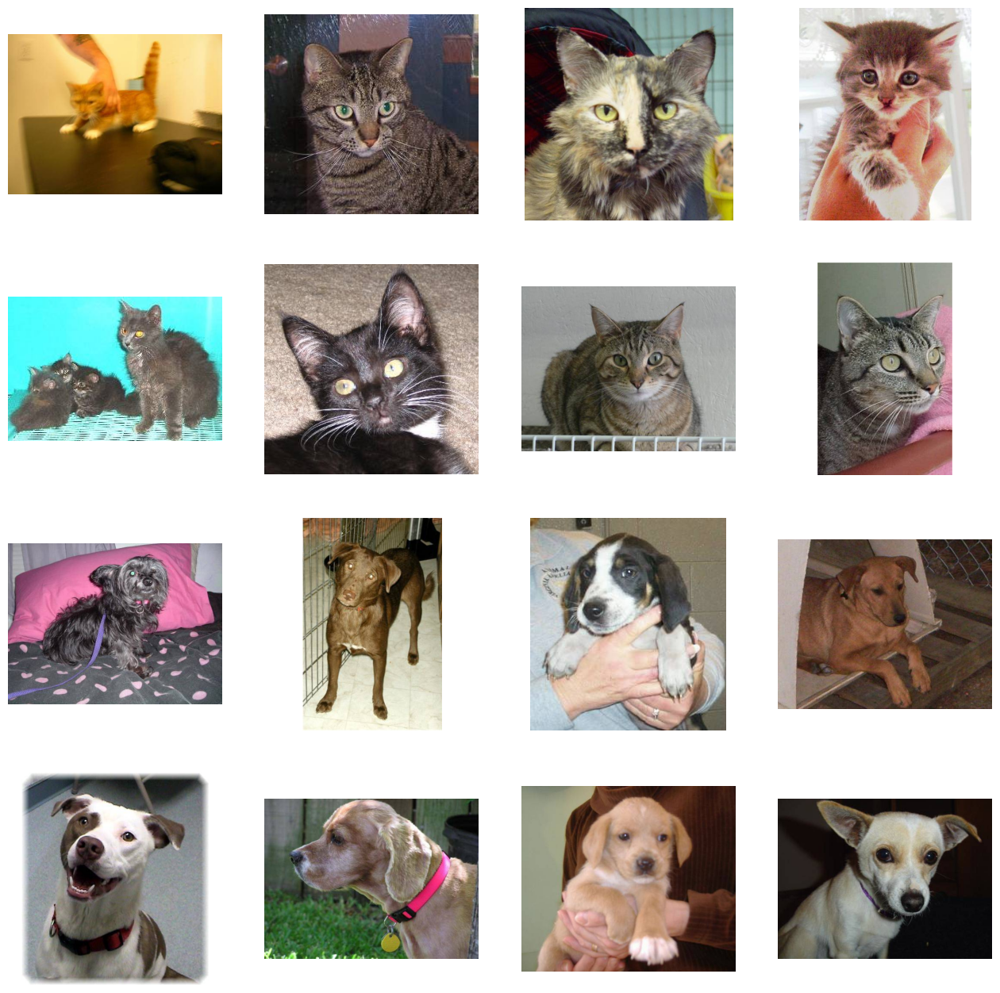

In [6]:
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_cat_pix = [os.path.join(train_cats_dir, fname) 
                for fname in train_cat_fnames[pic_index-8:pic_index]]
next_dog_pix = [os.path.join(train_dogs_dir, fname) 
                for fname in train_dog_fnames[pic_index-8:pic_index]]

for i, img_path in enumerate(next_cat_pix+next_dog_pix):
  # Set up subplot; subplot indices start at 1
    sp = plt.subplot(nrows, ncols, i + 1)
    sp.axis('Off') # Don't show axes (or gridlines)
    img = mpimg.imread(img_path)
    plt.imshow(img)

plt.show()


### Data Preprocessing

Let's set up data generators that will read pictures in our source folders, convert them to `float32` tensors, and feed them (with their labels) to our network. We'll have one generator for the training images and one for the validation images. Our generators will yield batches of 20 images of size 150x150 and their labels (binary).

As you may already know, data that goes into neural networks should usually be normalized in some way to make it more amenable to processing by the network. (It is uncommon to feed raw pixels into a convnet.) In our case, we will preprocess our images by normalizing the pixel values to be in the `[0, 1]` range (originally all values are in the `[0, 255]` range).

In Keras this can be done via the `keras.preprocessing.image.ImageDataGenerator` class using the `rescale` parameter. This `ImageDataGenerator` class allows you to instantiate generators of augmented image batches (and their labels) via `.flow(data, labels)` or `.flow_from_directory(directory)`. These generators can then be used with the Keras model methods that accept data generators as inputs: `fit_generator`, `evaluate_generator`, and `predict_generator`.

In [7]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical

# All images will be rescaled by 1./255
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

base_dir = './dataset_tarea_1_2023'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')


# Flow training images in batches of 20 using train_datagen generator
train_generator = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    labels='inferred',
    label_mode='categorical',
    class_names=None,
    color_mode='rgb',
    batch_size=32,
    image_size=(256, 256),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation='bilinear',
    follow_links=False,
    crop_to_aspect_ratio=False)


# Flow training images in batches of 20 using train_datagen generator
validation_generator = tf.keras.utils.image_dataset_from_directory(
    validation_dir,
    labels='inferred',
    label_mode='categorical',
    class_names=None,
    color_mode='rgb',
    batch_size=32,
    image_size=(256, 256),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation='bilinear',
    follow_links=False,
    crop_to_aspect_ratio=False)

# Flow training images in batches of 20 using train_datagen generator
test_generator = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    labels='inferred',
    label_mode='categorical',
    class_names=None,
    color_mode='rgb',
    batch_size=32,
    image_size=(256, 256),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation='bilinear',
    follow_links=False,
    crop_to_aspect_ratio=False)



Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.
Found 738 files belonging to 2 classes.


# 2. Modelo CNN Personalizado

Su ejecución se encuentra en el notebook:
- 599_2__CNN_2023

# 3. Transfer Learning & Fine Tuning

Ventajas de Utilizar Modelos Preentrenados:

- **Conocimiento Preexistente**: Los modelos preentrenados, como VGG16, vienen equipados con patrones y características ya aprendidos de conjuntos de datos amplios y variados, tales como ImageNet, lo que les permite reconocer una gran variedad de características visuales desde el principio.

- **Ahorro de Tiempo y Recursos Computacionales**: Al utilizar un modelo preentrenado, se salta el costoso y prolongado proceso de entrenamiento inicial. Esto es especialmente valioso cuando se cuenta con limitaciones de hardware o cuando se desea prototipar rápidamente.

- **Desempeño Potenciado**: Estos modelos han sido entrenados en millones de imágenes, permitiéndoles desarrollar una comprensión profunda y diversa del mundo visual que a menudo supera lo que se podría lograr con conjuntos de datos más pequeños y específicos.

- **Flexibilidad y Adaptabilidad**: Los modelos preentrenados pueden ser finamente ajustados para tareas específicas, lo que permite a los usuarios adaptar potentes redes neuronales a sus necesidades particulares con solo una fracción del esfuerzo que requeriría entrenar desde cero.

La preentrenación es una herramienta poderosa en el arsenal del aprendizaje profundo. Proporciona una sólida base de conocimiento que puede ser especializada para nuevas tareas con menor inversión y tiempos de desarrollo. Esto democratiza el acceso a la tecnología de punta en visión por computadora, permitiendo a los investigadores y desarrolladores construir soluciones sofisticadas sin la necesidad de vastos recursos computacionales.

In [8]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization, GaussianNoise
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np

In [9]:
# Inicializa el modelo base de VGG16 sin las capas superiores y cargando pesos pre-entrenados de ImageNet
base_model = VGG16(input_shape=(256, 256, 3), include_top=False, weights='imagenet')

# Congela las capas del modelo base para que no se actualicen durante el primer proceso de entrenamiento
for layer in base_model.layers:
    layer.trainable = False

base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

#### Inicialización del modelo VGG16 para Transfer Learning

El modelo VGG16 es una arquitectura de red neuronal convolucional profundamente establecida que ha demostrado ser eficaz en la clasificación de imágenes y detección de objetos. Esta red, desarrollada por Visual Graphics Group de Oxford (de ahí su nombre VGG), se destacó por su simplicidad y profundidad cuando fue presentada. El modelo consiste en una secuencia de capas convolucionales con pequeños filtros de 3x3 seguidos de capas de pooling de maxima, y termina con un conjunto de capas densas. 

Las principales razones para su elección como modelo base para Transfer Learning son:

1. **Pre-entrenamiento en ImageNet**: VGG16 viene pre-entrenado con el conjunto de datos de ImageNet, que contiene millones de imágenes clasificadas en miles de categorías. Esto le permite a la red ya haber aprendido una rica representación de características para una amplia variedad de imágenes, lo cual es útil para la mayoría de las tareas de visión por computadora.

2. **Arquitectura profunda y generalizable**: Gracias a su profundidad y a la cantidad de filtros incrementales, puede capturar características desde muy generales hasta muy específicas, lo que la hace adaptable a nuevos conjuntos de datos con tan solo un ajuste fino de las capas superiores.

3. **Congelación de capas**: Congelamos las capas del modelo VGG16 durante el proceso de entrenamiento para evitar que los pesos pre-entrenados se modifiquen. Al hacer esto, podemos utilizar la representación de características aprendida por el modelo en ImageNet y solo enfocarnos en aprender los pesos de las nuevas capas superiores que agregaremos, las cuales serán específicas para nuestro conjunto de datos particular.

Al mantener congeladas las capas originales de VGG16, nos beneficiamos de un entrenamiento más rápido y eficiente, ya que evitamos el sobreajuste en las primeras etapas del aprendizaje y nos aseguramos de que las características complejas y útiles que ha aprendido el modelo no se pierdan durante el proceso de ajuste fino.

**Resumen del modelo**:
- **Input**: Imágenes de tamaño `(256, 256, 3)`, lo que significa que espera imágenes en color (3 canales) con una resolución de 256x256.
- **Capas convolucionales**: Varias capas que aplican filtros para extraer características de las imágenes. Comienzan con 64 filtros y duplican en número a medida que la red se profundiza, hasta llegar a 512.
- **Capas de pooling**: Reducen la dimensionalidad de las características extraídas, lo cual ayuda a reducir la cantidad de parámetros y computación en la red.
- **Parámetros totales**: 14,714,688, todos los cuales son pre-entrenados y congelados para transferir el conocimiento a un nuevo problema de clasificación de imágenes.

Con esta base sólida, podemos proceder a extender el modelo con nuevas capas que serán entrenadas específicamente para nuestro conjunto de datos.


In [10]:
# Extender el modelo base con nuevas capas
x = base_model.output
x = Flatten()(x)

# Añadir una capa de ruido para la robustez del modelo
x = GaussianNoise(0.1)(x)

# Añadir una capa densa con regularización L2 y normalización por lotes
x = Dense(1024, kernel_regularizer=l2(0.001))(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x) 
x = Dropout(0.5)(x)

# Añadir una segunda capa densa con regularización L2 y normalización por lotes
x = Dense(512, kernel_regularizer=l2(0.001))(x)
x = BatchNormalization()(x)
x = LeakyReLU()(x)
x = Dropout(0.5)(x)

# Capa de salida con activación softmax para clasificación
x = Dense(2, activation='softmax')(x)

### Modelo Extendido de VGG16

Al extender VGG16, se añaden capas que aumentan la capacidad del modelo y su generalización:

- **Flatten Layer**: Transforma la salida en un vector, un paso necesario para transitar de las capas convolucionales a las densas.

- **GaussianNoise Layer**: Aporta robustez, introduciendo ruido durante el entrenamiento para forzar al modelo a aprender patrones estables y generalizables.

- **Dense Layers with L2 Regularization**: Aumentan la capacidad de aprendizaje de relaciones complejas y la regularización L2 contrarresta el sobreajuste.

- **BatchNormalization Layers**: Estabilizan y aceleran el entrenamiento al normalizar las activaciones de las capas.

- **LeakyReLU Activation**: Evita neuronas "muertas" permitiendo una pequeña activación cuando la entrada es negativa, lo que mejora el flujo de gradientes.

- **Dropout Layers**: Previenen la dependencia excesiva de cualquier neurona apagando aleatoriamente un conjunto de ellas durante el entrenamiento.

- **Softmax Output Layer**: Esta capa tendrá dos unidades, una para cada clase (perro y gato). Por ejemplo, si la salida de la red para una imagen particular es [1.2, 0.9], la función softmax convertiría estos valores en probabilidades que suman 1. Después de aplicar softmax, podríamos obtener algo como [0.57, 0.43]. Este resultado se interpretaría como un 57% de probabilidad de que la imagen sea de un perro y un 43% de probabilidad de que sea de un gato.

Al extender VGG16 con capas adicionales en el contexto de un modelo de clasificación de imágenes de perros y gatos, se busca potenciar la capacidad del modelo para aprender y generalizar a partir de las características visuales específicas de estas dos categorías. La inclusión de ruido, regularización y normalización por lotes está dirigida a mejorar la robustez y la eficacia del modelo en la distinción entre las imágenes de perros y gatos, evitando el sobreajuste a las imágenes de entrenamiento y mejorando la precisión en datos no vistos previamente.

In [11]:
# Compila el nuevo modelo
model = Model(inputs=base_model.input, outputs=x)
model.compile(optimizer=RMSprop(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [12]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

#### Model Summary

- **Input Layer**: Toma imágenes de tamaño `(256, 256, 3)`, lo que indica imágenes en color con alta resolución.
- **Convolutional Blocks (1-5)**: Contienen capas convolucionales (`Conv2D`) y de pooling (`MaxPooling2D`). Cada bloque incrementa la profundidad de los filtros, capturando características más complejas. Las dimensiones espaciales se reducen a medida que avanza en los bloques, de `(256, 256)` a `(8, 8)`.
- **Flatten Layer**: Transforma la salida tridimensional del último bloque convolucional en un vector unidimensional de tamaño `32768`.
- **Gaussian Noise Layer**: Añade ruido gaussiano a los datos como técnica de regularización para prevenir el sobreajuste y mejorar la generalización del modelo.
- **Dense Layers**: Dos capas densas con `1024` y `512` unidades respectivamente, ambas con regularización L2 para penalizar los pesos grandes y con normalización por lotes para estabilizar y acelerar el entrenamiento. Utilizan la función de activación `LeakyReLU`, que permite un pequeño gradiente cuando la unidad no está activa.
- **Dropout Layers**: Después de cada capa densa, se aplica `Dropout` con una tasa de `0.5`, descartando aleatoriamente la mitad de las características para mejorar la robustez del modelo.
- **Output Layer**: Capa final con dos unidades y activación `softmax`, que proporciona una distribución de probabilidad sobre las dos clases objetivo.

**Detalles Adicionales**

- **Total Parameters**: `48,802,114`, de los cuales `34,084,354` son entrenables y `14,717,760` no lo son debido al congelamiento de las capas base de VGG16.
- **Memory Size**: El modelo ocupa aproximadamente `186.17 MB`.

Este resumen indica que el modelo es bastante grande y complejo, adecuado para tareas que requieren un alto nivel de abstracción de características visuales, como la clasificación de perros y gatos con un conjunto de datos grande y variado.

In [13]:
# # Configuración del callback de EarlyStopping para detener el entrenamiento cuando no hay mejora en la precisión de validación
# early_stopping_cb = EarlyStopping(
#     monitor='val_accuracy',  
#     patience=7,            
#     restore_best_weights=True 
# )

# # Configuración del callback de ReduceLROnPlateau para reducir la tasa de aprendizaje cuando una métrica ha dejado de mejorar
# reduce_lr_cb = ReduceLROnPlateau(
#     monitor='val_loss',     
#     factor=0.5,            
#     patience=3,    
#     min_lr=0.00001    
# )

# Configuración del callback de ModelCheckpoint para guardar el mejor modelo
checkpoint_cb = ModelCheckpoint(
    'trainModels/best_model1.h5',
    save_best_only=True,
    monitor='val_accuracy',
    mode='max'
)

# Entrenamiento del modelo con los callbacks
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
    callbacks=[checkpoint_cb]
    # callbacks=[checkpoint_cb, early_stopping_cb, reduce_lr_cb]
)

Epoch 1/10
63/63 [==============================] - ETA: 0s - loss: 2.8625 - accuracy: 0.9130

C:\Users\marib\OneDrive - U-tad\U_tad\Curso3\1Semestre\InteligenciaArtificial\python\MiEntornoVirtual\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


63/63 [==============================] - 189s 3s/step - loss: 2.8625 - accuracy: 0.9130 - val_loss: 2.7427 - val_accuracy: 0.9580
Epoch 2/10
63/63 [==============================] - 189s 3s/step - loss: 2.6183 - accuracy: 0.9800 - val_loss: 2.5711 - val_accuracy: 0.9790
Epoch 3/10
63/63 [==============================] - 199s 3s/step - loss: 2.4635 - accuracy: 0.9925 - val_loss: 2.4404 - val_accuracy: 0.9760
Epoch 4/10
63/63 [==============================] - 201s 3s/step - loss: 2.3342 - accuracy: 0.9900 - val_loss: 2.3239 - val_accuracy: 0.9720
Epoch 5/10
63/63 [==============================] - 201s 3s/step - loss: 2.1871 - accuracy: 0.9945 - val_loss: 2.1792 - val_accuracy: 0.9730
Epoch 6/10
63/63 [==============================] - 202s 3s/step - loss: 2.0489 - accuracy: 0.9975 - val_loss: 2.1507 - val_accuracy: 0.9470
Epoch 7/10
63/63 [==============================] - 201s 3s/step - loss: 1.9303 - accuracy: 0.9940 - val_loss: 1.9587 - val_accuracy: 0.9630
Epoch 8/10
63/63 [======

**Nota**: La decisión de no utilizar el callback de `EarlyStopping` en el proceso de entrenamiento fue porque he observado su uso no aportaba mejoras ya que  afectaba negativamente la estabilidad del aprendizaje aunque mantenía el mismo accuracy. Aquí están algunas suposiciones por las que esto puede suceder:

1. **Convergencia Rápida**: Si el modelo alcanza rápidamente una alta precisión y luego no mejora o mejora muy lentamente, el `EarlyStopping` puede detener el entrenamiento demasiado pronto. Esto podría impedir que el modelo atraviese fases donde temporalmente podría empeorar antes de encontrar un ajuste más óptimo.

2. **Variabilidad en la Validación**: Los datos de validación pueden tener variabilidad natural, y si la métrica de `val_accuracy` fluctúa, `EarlyStopping` podría detener el entrenamiento durante un descenso temporal que no refleja la tendencia general de mejora del modelo.

3. **Paciencia Insuficiente**: Una paciencia de 7 épocas podría no ser suficiente para superar el ruido en la métrica de rendimiento. Puede que el modelo necesitase más tiempo para que las mejoras sean evidentes, especialmente si está aprendiendo patrones más sutiles en los datos.

4. **Restauración de Pesos No Óptima**: Aunque `restore_best_weights` puede ayudar a recuperar el estado del modelo con el mejor rendimiento, esto no siempre garantiza que el modelo haya aprendido las representaciones más generales posibles, especialmente si el mejor rendimiento no coincide con una buena generalización.

5. **Reducir la Tasa de Aprendizaje**: El uso de `ReduceLROnPlateau` puede ser contraproducente si la reducción de la tasa de aprendizaje se hace de manera muy agresiva o prematura, llevando al modelo a un estado de aprendizaje demasiado conservador y evitando la exploración efectiva del espacio de parámetros.

En resumen, la estabilidad en el aprendizaje y el progreso hacia una generalización robusta a veces requieren que el modelo experimente y aprenda de sus errores a lo largo de más épocas, sin ser interrumpido prematuramente por callbacks que están diseñados para salvaguardar contra el sobreajuste o la falta de progreso. La clave estaría en encontrar el equilibrio adecuado entre permitir que el modelo aprenda a lo largo del tiempo y utilizar mecanismos para prevenir el sobreajuste.

**Nota de la advertencia**:La advertencia emitida durante el proceso de guardado del modelo se debe a una preferencia actual por el formato nativo de Keras sobre el formato HDF5. La recomendación de Keras es utilizar su propio formato de archivo, que es más moderno y ofrece algunas ventajas, como una mejor integración con las funcionalidades de Keras y potencialmente un almacenamiento más eficiente de los modelos.


In [14]:
# Cargar el modelo guardado
# model = load_model('trainModels/best_model1.h5')

In [15]:
test_loss, test_acc = model.evaluate(test_generator)

24/24 [==============================] - 52s 2s/step - loss: 2.1543 - accuracy: 0.8401


In [16]:
print('test_acc:', test_acc)

test_acc: 0.8401083946228027


#### Análisis de Resultados y Conclusiones Iniciales del Modelo

#### Resultados de Entrenamiento

- **Época 1**: El modelo comienza con una alta precisión de entrenamiento (`accuracy: 0.9130`) y una pérdida significativa (`loss: 2.8625`). La precisión de validación es excepcionalmente alta (`val_accuracy: 0.9580`), lo que indica un buen inicio.
- **Épocas 2-10**: La precisión de entrenamiento mejora constantemente, alcanzando casi la perfección (`accuracy: 0.9990` en la Época 10), mientras que la pérdida disminuye consistentemente. La precisión de validación experimenta algunas fluctuaciones pero se mantiene en un rango elevado, indicando una buena generalización durante el entrenamiento.

#### Evaluación del Test

- **Precisión en el Conjunto de Test**: `accuracy: 0.8401`. Aunque es competitiva, se observa una diferencia con la precisión de entrenamiento, lo que podría indicar sobreajuste.

#### Conclusiones Iniciales

- **Fortaleza en Aprendizaje**: El modelo demuestra una capacidad impresionante para aprender y ajustarse a los datos de entrenamiento, reflejado en la alta precisión alcanzada.
- **Reto en Generalización**: La disminución en la precisión al evaluar el conjunto de test sugiere que el modelo puede estar sobreajustado y que se beneficiaría de una mejor estrategia de generalización.
- **Estabilidad en Validación**: La precisión en validación se mantiene alta y relativamente estable, lo cual es alentador para la confiabilidad del modelo.

### Implicaciones para Mejoras Futuras

- **Mejorar la Generalización**: Deberían implementarse técnicas adicionales para que la precisión de entrenamiento se refleje en el conjunto de test, lo que podría incluir una mayor regularización y un enfoque más refinado en el aumento de datos.
- **Monitoreo Continuo**: Es crucial continuar evaluando el modelo para garantizar que cualquier mejora en la precisión de entrenamiento se traduzca en una mejor generalización a datos no vistos.

Este análisis resalta que, aunque el modelo tiene un excelente desempeño en el aprendizaje de los datos de entrenamiento, existe la necesidad de mejorar su habilidad para generalizar y así asegurar su eficacia en entornos de aplicación real de clasificación de imágenes de perros y gatos.

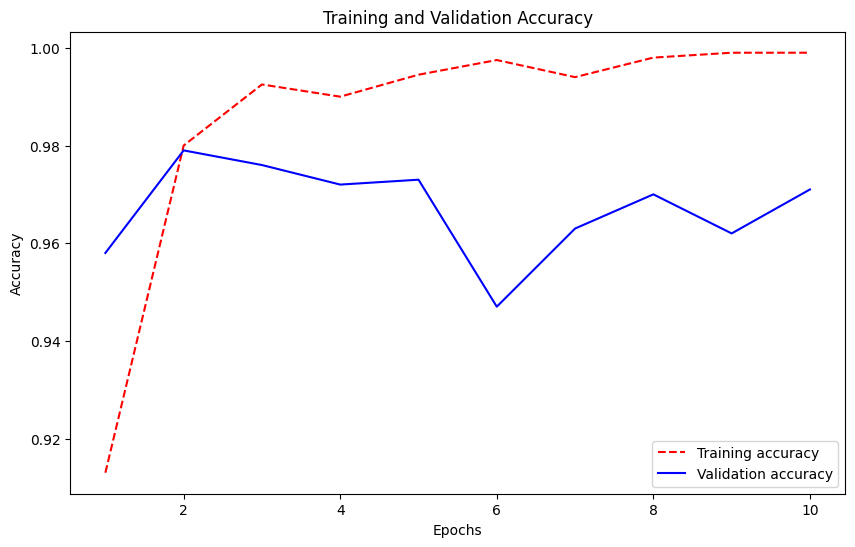

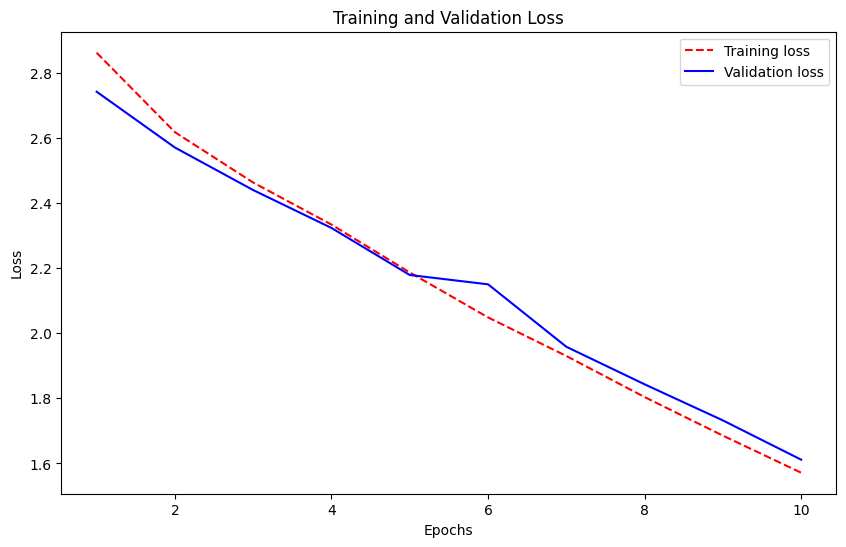

In [17]:
acc = history.history['accuracy']  
val_acc = history.history['val_accuracy']  
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# Gráfico de precisión (accuracy)
plt.figure(figsize=(10, 6))
plt.plot(epochs, acc, 'r--', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Gráfico de pérdida (loss)
plt.figure(figsize=(10, 6))
plt.plot(epochs, loss, 'r--', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

Para comentar sobre los resultados y las gráficas del entrenamiento de un modelo de clasificación de imágenes de perros y gatos utilizando VGG16 y técnicas de aumento de datos, primero analizaremos las gráficas de precisión y pérdida proporcionadas y luego discutiremos las conclusiones y posibles mejoras.

### Análisis de la Gráfica de Precisión

- **Precisión de Entrenamiento (línea roja discontinua)**: La gráfica muestra una precisión de entrenamiento elevada y bastante constante, lo que sugiere que el modelo ha aprendido efectivamente las características de los datos de entrenamiento.

- **Precisión de Validación (línea azul sólida)**: Se observa una tendencia general ascendente en la precisión de validación, aunque con una caída notable alrededor de la cuarta y sexta época. Esto puede indicar que el modelo encontró ejemplos particularmente desafiantes en el conjunto de validación que temporalmente redujeron su precisión.

#### Interpretación

Las fluctuaciones en la precisión de validación sugieren que el modelo puede estar experimentando sobreajuste o que hay una variabilidad significativa en la dificultad de los ejemplos de validación. 

### Análisis de la Gráfica de Pérdida

- **Pérdida de entrenamiento (línea roja discontinua)**: decrece de manera constante a medida que avanzan las épocas. Este es un indicador típico de que el modelo está aprendiendo y mejorando su rendimiento en el conjunto de entrenamiento a lo largo del tiempo.
  
- **Pérdida de validación (línea azul sólida)**: también sigue una tendencia descendente, aunque presenta un leve pico en torno a la sexta época. Este pico no es muy pronunciado y la línea retoma rápidamente su tendencia a la baja, lo que sugiere que el modelo no se ve gravemente afectado por el sobreajuste en ese punto y es capaz de recuperarse y seguir generalizando bien.

#### Interpretación

El hecho de que solo haya un pico menor en la gráfica de pérdida de validación y que la tendencia general sea descendente es un buen signo. No obstante, este pico podría ser un indicio de que en ese punto particular del entrenamiento, el modelo ha encontrado un lote de datos de validación más difícil de lo normal, o que ha habido un ligero sobreajuste que luego se ha corregido.

En resumen, la presencia de un pico menor en la gráfica de pérdida de validación no es necesariamente un motivo de preocupación y puede ser parte del proceso normal de aprendizaje y validación del modelo. Sin embargo, siempre es útil investigar cualquier irregularidad para entender completamente el comportamiento del modelo y asegurar su rendimiento óptimo.

### Conclusiones y Mejoras

El modelo muestra un alto grado de precisión en el conjunto de entrenamiento, lo que se refleja en las altas métricas de precisión observadas durante las épocas. Sin embargo, la precisión en el conjunto de prueba es sustancialmente más baja, lo que implica que el modelo no está generalizando tan bien como nos gustaría a los datos no vistos. Esto puede ser un signo de sobreajuste a los datos de entrenamiento, a pesar del uso de técnicas de regularización y aumento de datos.

#### Posibles Mejoras

**Generalización y Sobreajuste:**
Las fluctuaciones en la precisión y los picos en la pérdida de validación sugieren que el modelo podría estar sobreajustándose a los datos de entrenamiento y teniendo dificultades para generalizar a datos nuevos. Esto es un indicativo de que el modelo podría beneficiarse de una estrategia de regularización más fuerte o un ajuste en la técnica de aumento de datos para proporcionar una variedad más amplia de ejemplos durante el entrenamiento.

**Regularización y Ajuste de Hiperparámetros:**
Podríamos exomplorar alguna técnicas de regularización adicionales como el aumento de la tasa de Dropout o la inclusión de más capas de normalización por lotes. También sería prudente revisar los hiperparámetros, como la tasa de aprendizaje, para encontrar un mejor equilibrio entre aprendizaje y generalización.

**Validación Independiente:**
Para obtener una evaluación más precisa de la capacidad de generalización del modelo, sería ideal realizar pruebas adicionales con un conjunto de datos de validación independiente y considerar la implementación de un conjunto de pruebas más diverso.

**Aumento de Datos:**
Dada la reducción en la precisión al aplicar el aumento de datos, podría ser necesario ajustar los parámetros de esta técnica. Por ejemplo, modificar la intensidad de las transformaciones o añadir variaciones adicionales que reflejen mejor la diversidad de las imágenes del mundo real podría mejorar la capacidad del modelo para generalizar.

Estas mejoras deberían aplicarse de manera iterativa, evaluando cuidadosamente su impacto en el rendimiento del modelo para garantizar que cada cambio conduce a una mejor generalización y no simplemente a una mejora en la precisión de entrenamiento.

1/1 [==============================] - 0s 414ms/step


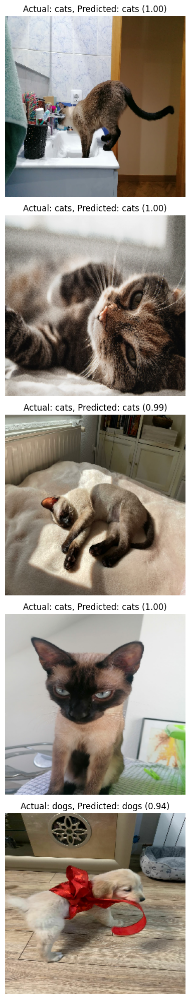

In [18]:
# Obtener un lote de imágenes y etiquetas del generador
for images, labels in test_generator.take(1):
    break  # Solo necesitamos un lote

# Seleccionar un subconjunto de imágenes y etiquetas para mostrar
num_images_to_display = 5
selected_images = images[:num_images_to_display]
selected_labels = labels[:num_images_to_display]

# Hacer predicciones con el modelo
predictions = model.predict(selected_images)

# Mapeo de etiquetas
class_names = test_generator.class_names

# Visualizar las imágenes con las etiquetas predichas y las reales
fig, axes = plt.subplots(num_images_to_display, 1, figsize=(12, num_images_to_display * 4))
for i in range(num_images_to_display):
    ax = axes[i]
    # Convertir el tensor a un array de NumPy y cambiar el tipo de datos
    image = tf.keras.preprocessing.image.array_to_img(selected_images[i])
    ax.imshow(image)
    ax.axis('off')
    actual_label_index = np.argmax(selected_labels[i])
    predicted_label_index = np.argmax(predictions[i])
    actual_label = class_names[actual_label_index]
    predicted_label = class_names[predicted_label_index]
    confidence = np.max(predictions[i])
    ax.set_title(f"Actual: {actual_label}, Predicted: {predicted_label} ({confidence:.2f})")

plt.tight_layout()
plt.show()

# Análisis Profundo de Modelos para Clasificación entre Perros y Gatos: CNN Personalizado vs. Transferencia de Aprendizaje con VGG16

En esta práctica comparamos dos modelos de aprendizaje profundo para la clasificación de imágenes de perros y gatos. Uno basado en una Red Neuronal Convolucional (CNN) personalizada y otro utilizando la técnica de Transferencia de Aprendizaje con la red VGG16, conocida por su eficacia en tareas de visión por computadora.

## Comparación de Métricas de Modelos CNN Personalizado y VGG16

### Precisión de los Modelos
La precisión final después de la formación nos da una medida cuantitativa de la eficacia de cada modelo:

- **CNN Personalizado**: Presenta una precisión de entrenamiento del `60.43%`.
- **VGG16 Transfer Learning**: Logra una precisión de entrenamiento del `84.01%`.

Estas cifras demuestran una ventaja clara para el modelo VGG16 en términos de capacidad para clasificar correctamente nuevas imágenes.

### Análisis de las Gráficas
Las gráficas de entrenamiento nos ofrecen una visión cualitativa del comportamiento de los modelos a lo largo del tiempo y su capacidad para generalizar a partir de los datos de entrenamiento.

#### Gráficas de Precisión (Accuracy)
- **CNN Personalizado**: Exhibe una gran discrepancia entre la precisión de entrenamiento y validación, lo cual es un indicador típico de sobreajuste.
- **VGG16 Transfer Learning**: Muestra una alineación mucho más estrecha entre las precisiones de entrenamiento y validación, lo que indica un buen equilibrio y una mejor generalización.

#### Gráficas de Pérdida (Loss)
- **CNN Personalizado**: La pérdida de entrenamiento disminuye de manera consistente, pero la de validación muestra variabilidad y picos, lo que sugiere que el modelo no está aprendiendo de forma general, sino memorizando los datos de entrenamiento.
- **VGG16 Transfer Learning**: La pérdida tanto de entrenamiento como de validación decrece de forma uniforme, lo que señala un aprendizaje estable y una buena adaptación a los datos, tanto conocidos como desconocidos.

### Conclusión de la Comparación
El modelo VGG16 con transferencia de aprendizaje supera al CNN personalizado tanto en precisión como en la calidad del aprendizaje a lo largo de las épocas de entrenamiento. La coherencia entre la precisión y la pérdida de entrenamiento y validación en el modelo VGG16 sugiere que es más adecuado para aplicaciones prácticas donde se requiere fiabilidad y generalización en la clasificación de imágenes.

## Por Qué Preferir Modelos Preentrenados como VGG16
Los modelos preentrenados como VGG16 demuestran una ventaja competitiva en escenarios de clasificación de imágenes debido a su capacidad previamente desarrollada para detectar características complejas y su robustez, lo cual es evidente en la estabilidad de las métricas de precisión y pérdida a lo largo de las épocas de entrenamiento. Su capacidad para generalizar y su alto rendimiento desde el comienzo del entrenamiento los hace preferibles, especialmente cuando se dispone de un conjunto de datos limitado o se busca eficiencia en tiempo y recursos computacionales.

### Conclusiones
Los resultados obtenidos refuerzan la validez de utilizar modelos preentrenados para tareas complejas de clasificación. El modelo VGG16 superó al CNN personalizado en precisión y mostró una mejor generalización, como se refleja en las gráficas de precisión y pérdida. Esto subraya la importancia de la transferencia de aprendizaje en el campo de la visión por computadora y resalta la eficacia de utilizar conocimientos previos para afrontar nuevos desafíos de clasificación con alta eficiencia.

# 4. Visualización de capas intermedias

In [19]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import preprocess_input
import numpy as np
import matplotlib.pyplot as plt

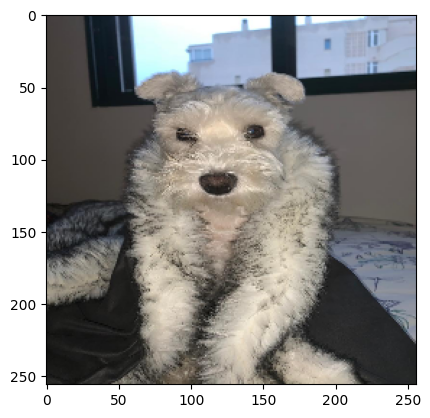

1/1 [==============================] - 0s 137ms/step


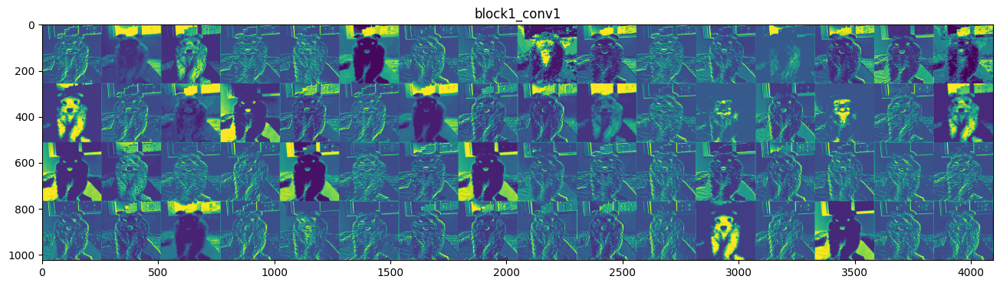

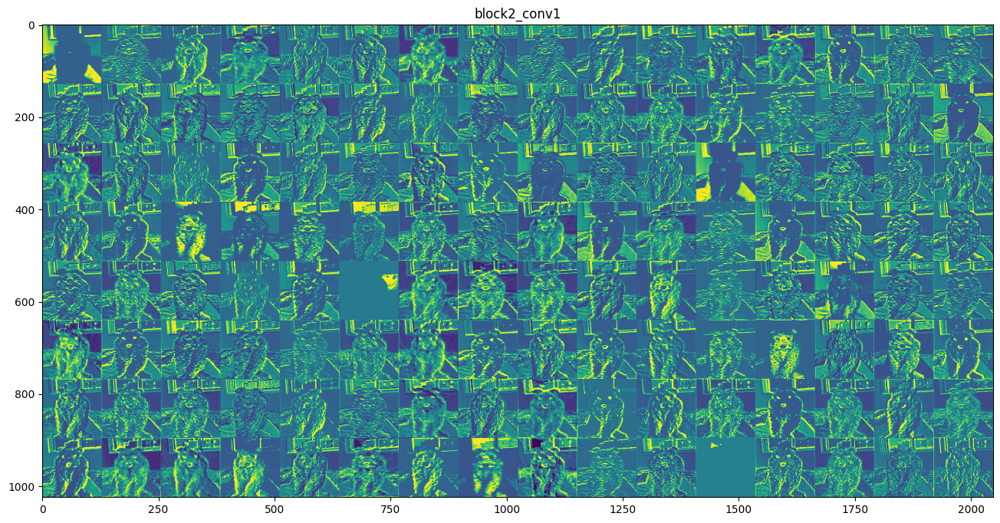

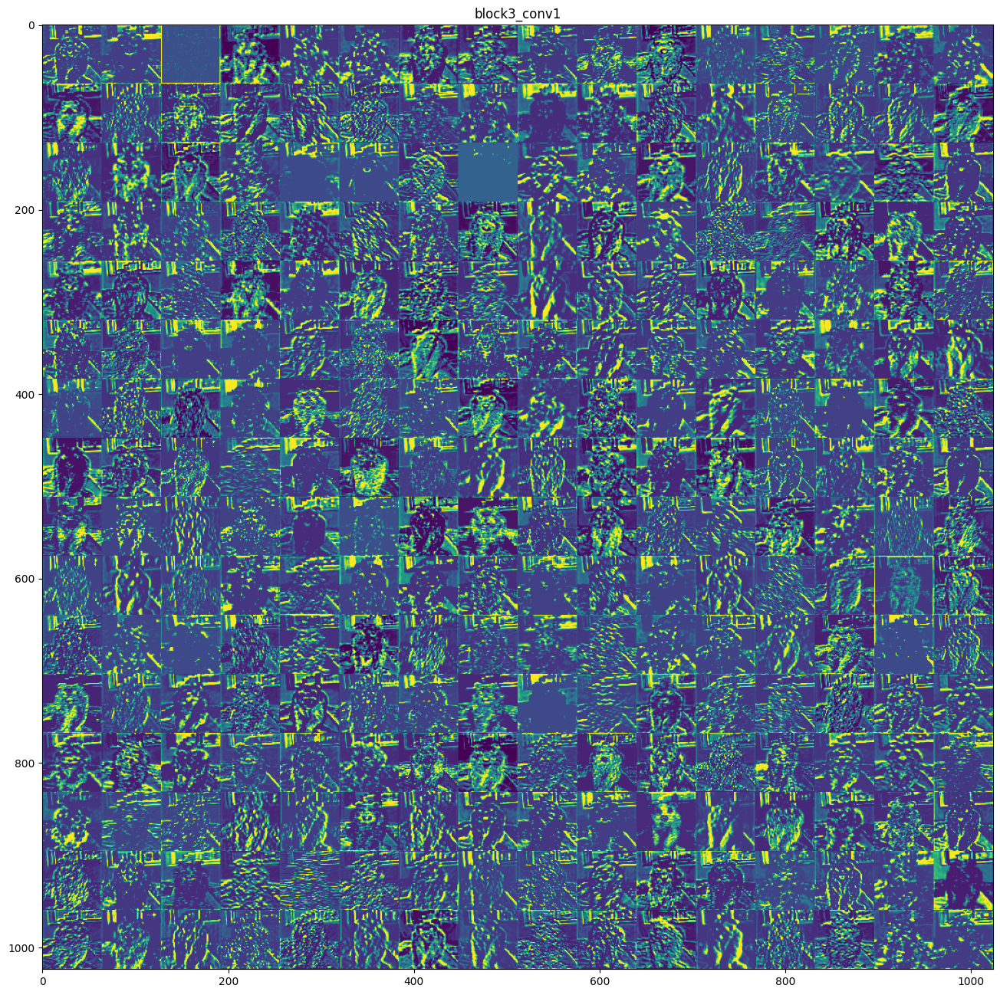

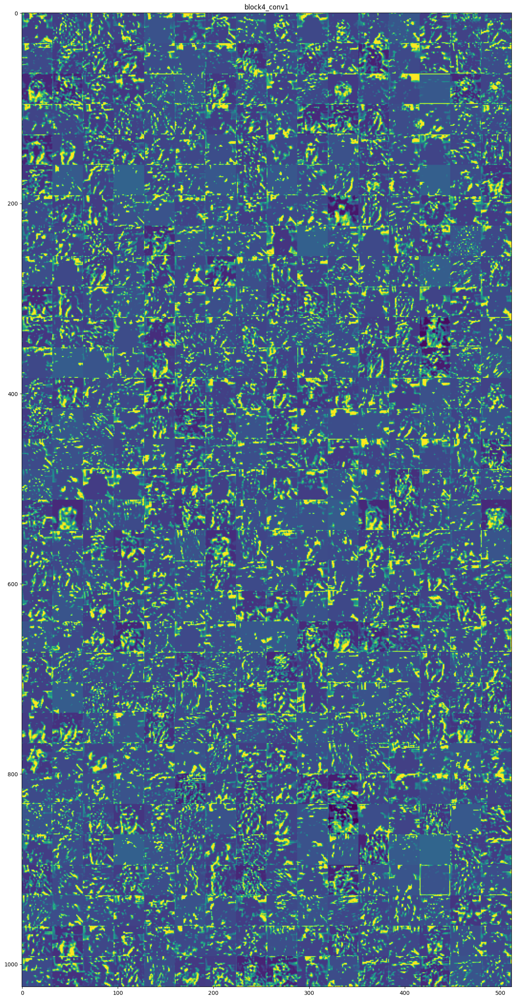

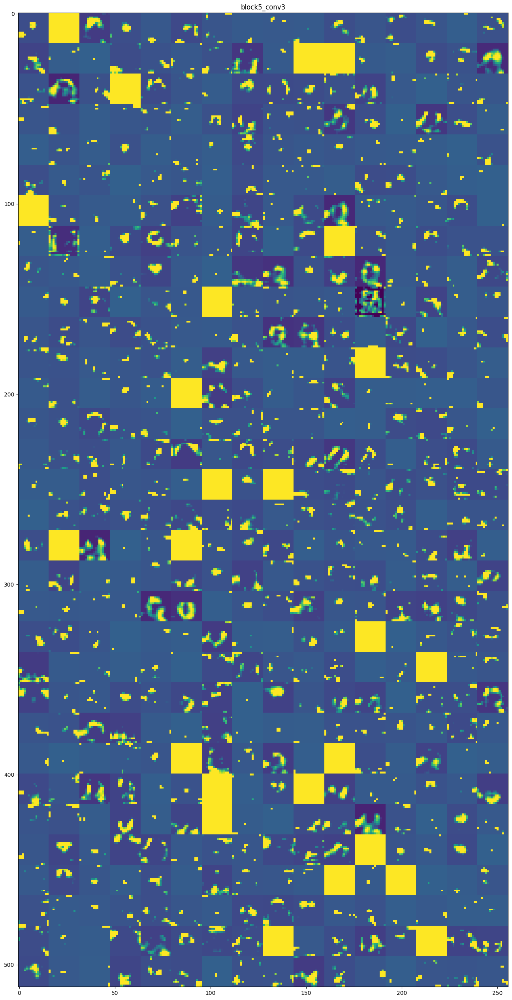

In [20]:
# Seleccionamos las capas
layer_names = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv3']
layer_outputs = [base_model.get_layer(name).output for name in layer_names]

# Crea un modelo que devolverá estas salidas, dado el modelo de entrada
activation_model = Model(inputs=base_model.input, outputs=layer_outputs)

# Carga y preprocesa la imagen
img_path = './dataset_tarea_1_2023/test/dogs/Foto (31).jpg'
img = image.load_img(img_path, target_size=(256, 256))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor = preprocess_input(img_tensor)


# Visualizar la imagen
plt.imshow(img)
plt.show()

# Obtiene las activaciones
activations = activation_model.predict(img_tensor)

# Visualiza las activaciones para cada capa seleccionada
for layer_activation, layer_name in zip(activations, layer_names):
    num_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    
    # Número de columnas para visualizar, ajustar según prefieras
    n_cols = num_features // 16
    
    display_grid = np.zeros((size * n_cols, size * 16))


    for col in range(n_cols):
        for row in range(16):
            channel_image = layer_activation[0, :, :, col * 16 + row]
            channel_image -= channel_image.mean()
            # Revisa si la desviación estándar es cero y evita la división en ese caso
            if channel_image.std() != 0:
                channel_image /= channel_image.std()
                channel_image *= 64
            else:
                # Si la std es cero, simplemente escala la imagen a 128
                channel_image = np.ones_like(channel_image) * 128
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

### Análisis Integral de las Activaciones de Capas Intermedias en VGG16

Las visualizaciones de las capas intermedias de VGG16 nos dan una perspectiva invaluable sobre cómo la red procesa las imágenes desde las características primitivas hasta los conceptos de alto nivel.

#### Visualizaciones Detalladas por Capas

- **Primera Capa (`block1_conv1`)**: Aquí vemos la detección de características básicas como bordes y texturas. En nuestro modelo, estas activaciones son variadas, lo que sugiere una respuesta adecuada a los elementos fundamentales de la imagen.

- **Segunda Capa (`block2_conv1`)**: Progresando a esta capa, la red empieza a reconocer texturas y formas más complejas. En nuestro análisis, algunas activaciones son menos definidas, lo que puede indicar la necesidad de un entrenamiento más profundo o una mejora en la recopilación de datos.

- **Tercera Capa (`block3_conv1`)**: A este nivel, se detectan características más complejas, como partes de objetos. Nuestro modelo muestra una respuesta a estas formas más complejas, pero hay margen para optimizar la captura de patrones.

- **Cuarta Capa (`block4_conv1`)**: Las representaciones se vuelven más abstractas, indicando la identificación de partes más significativas de los objetos o escenas. Si las activaciones son demasiado abstractas, como se observa en algunos filtros de nuestro caso, esto podría señalar una oportunidad para refinar la arquitectura.

- **Quinta Capa (`block5_conv3`)**: En la profundidad de la red, las activaciones reflejan conceptos de alto nivel. En nuestro modelo, si estas activaciones no son claramente discernibles, podríamos necesitar reajustar o simplificar la complejidad de la red para mejorar la interpretación de las características.

#### Conclusiones e Implicaciones para la Mejora del Modelo

La transición de lo simple a lo complejo a través de las capas muestra que las primeras capas capturan detalles generales, mientras que las capas profundas se enfocan en detalles específicos más relevantes para la clasificación. La interpretación de estas características se vuelve menos intuitiva para los humanos a medida que nos adentramos en la red.

Para mejorar nuestro modelo:
- **Datos de Entrenamiento:** La claridad y relevancia de las activaciones pueden indicar la necesidad de más datos o mejor data augmentation.
- **Ajustes Arquitectónicos:** La activación de patrones no discriminativos en capas profundas puede requerir ajustes en la arquitectura para una mejor extracción de características.

Estas visualizaciones nos proporcionan una comprensión más profunda del aprendizaje de la red y nos orientan sobre cómo podemos mejorar el modelo para obtener un rendimiento óptimo.

# 5. Data Augmentation

Su ejecución se encuentra en el notebook:
- 599_5_CNN_Data_Augmentation_2023

# 6. Recursos

- jorditorresBCN. (s. f.-a). Python-deep-learning/08_Redes_neuronales_convolucionales.ipynb at Master · jorditorresBCN/python-deep-learning. GitHub. https://github.com/jorditorresBCN/python-deep-learning/blob/master/08_redes_neuronales_convolucionales.ipynb
- jorditorresBCN. (s. f.). Python-deep-learning/11_DataAugmentation_y_TransferLearning.ipynb at Master · jorditorresBCN/python-deep-learning. GitHub. https://github.com/jorditorresBCN/python-deep-learning/blob/master/11_DataAugmentation_y_TransferLearning.ipynb
- Jauregui, A. F. (2023, 24 agosto). Qué son y cómo crear una red neuronal convolucional con Keras. Ander Fernández. https://anderfernandez.com/blog/que-es-una-red-neuronal-convolucional-y-como-crearlaen-keras/
- Gonzalez, S. (2021, 13 octubre). Redes neuronales para clasificar imágenes: TensorFlow y Keras. Model Differently. https://www.modeldifferently.com/2021/10/image_classification/